In [1]:
suppressPackageStartupMessages({
    library(dplyr)
    library(ggplot2)
    library(Matrix)
    library(scran)
    library(Rtsne)
    library(BiocParallel)
    require(irlba)
    library(stringr)
    library(gridExtra) ## can be replaced by just cowplot
    library(cowplot)
    #library(Seurat)
    #library(M3C)
    #library(batchelor)
})

In [ ]:
# chimaera
mixl_data_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/mlnt/3_QC/raw_counts.rds"
mixl_genes_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/mlnt2/PhD_MT07_Mixl1/2_calledCells/genes.tsv"
mixl_meta_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/mlnt/5_doubletDetection/meta.tab" # contains QC performed by Mlnt

# atlas
atlas_data_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/raw_counts.mtx"
atlas_genes_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/genes.tsv"
atlas_meta_in = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/atlas/atlas/meta.tab"


# out folder
out_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/data/"
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"

In [ ]:
meta_meso

In [ ]:
# load mixl data
mixl_counts = readRDS(mixl_data_in)
mixl_genes = read.table(mixl_genes_in, stringsAsFactors = F)
mixl_meta = read.table(mixl_meta_in, header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
mixl_meta$cell <- paste0('chim_', mixl_meta$cell)
# annotate mixl counts
rownames(mixl_counts) = mixl_genes[,1] #ensembl
colnames(mixl_counts) = mixl_meta$cell

# load atlas data
atlas_counts = readMM(atlas_data_in) # readMM for .mtx input 
atlas_genes = read.table(atlas_genes_in, stringsAsFactors = F)
atlas_meta = read.table(atlas_meta_in, header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
atlas_meta$cell <- paste0('atlas_', atlas_meta$cell)
# annotate atlas counts
rownames(atlas_counts) = atlas_genes[,1] #ensembl
colnames(atlas_counts) = atlas_meta$cell



In [ ]:
meta_meso$cell <- paste0('atlas_', meta_meso$cell)
meta_meso

In [ ]:
big_meta = read.table(paste0(out_folder,"big_meta_mapping.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
big_meta

In [ ]:
colnames(big_meta)

In [ ]:
#big_meta.obs
meta_meso['cell']

In [ ]:
print(unique(big_meta$celltype))
print(unique(meta_meso$celltype))

In [ ]:
length(unique(big_meta$celltype))

In [ ]:
length(unique(meta_meso$celltype))

In [ ]:
unique(meta_meso$celltype)

In [ ]:
dim(big_meta)

In [ ]:
#big_meta_meso = merge(big_meta, meta_meso, by='cell', all.x = TRUE) 
#big_meta_meso

In [ ]:
#colnames(big_meta_meso)
#length(unique(big_meta_meso$celltype.x))
#length(unique(big_meta_meso$celltype.y))
#print(dim(big_meta_meso))
#print(unique(big_meta_meso$celltype.y))

In [ ]:
big_meta$celltype[match(meta_meso$cell, big_meta$cell)] <- levels(meta_meso$celltype)

In [ ]:
colnames(big_meta)
length(unique(big_meta$celltype))
print(dim(big_meta))
print(unique(big_meta$celltype))

In [ ]:
big_meta

In [ ]:
#Save big_meta to new file for the rest as big_meta meso > or was it not necessary to do it now?

# Remapping of paraxial and somitic mesoderm chimeric cells to refined subclusters

In [153]:
# Load in data
big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso3.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
pca_after = as.data.frame(read.csv(paste0(out_folder, 'corrected_pc_complete.csv'), header=T, row.names=1,sep=","))
pca_after$cell <- rownames(pca_after)

In [154]:
# label origin in metadata
big_meta$origin <- sapply(strsplit(big_meta$cell,"_"), `[`, 1) 

In [155]:
# split atlas and chimaera
atlas_cells = big_meta %>% filter(origin=='atlas') %>% .$cell
correct_atlas = pca_after %>% filter(cell %in% atlas_cells)
atlas_meta = big_meta %>% filter(origin=='atlas')
correct_map = pca_after %>% filter(!cell %in% atlas_cells) %>% select(1:50) # keep only PC columns
map_meta = big_meta %>% filter(origin!='atlas') 

In [156]:
# Downsample atlas to 10k cells per timepoint 
keep = lapply(unique(atlas_meta$stage), function(x){
  if(x == "mixed_gastrulation"){
    return(atlas_meta[atlas_meta$stage == x,]$cell)
  } else if(sum(atlas_meta$stage == x) < 10000) {
    return(atlas_meta[atlas_meta$stage == x,]$cell)
  } else {
    return(atlas_meta[atlas_meta$stage == x,]$cell)
    return(sample(hits, 10000))
  }
})
keep = do.call(c, keep)
keep <- as.list(keep)

atlas_meta = atlas_meta %>% filter(cell %in% keep)
correct_atlas = correct_atlas %>% filter(cell %in% keep) %>% select(1:50)

In [ ]:
## standard mapping only on stage & celltype, add extra columns if you want to map them, e.g. meso_subclust
# indicated by ## ADD HERE

In [159]:
## Code for mapping:

library(BiocNeighbors)

getmode <- function(v, dist) {
  tab = table(v)
  #if tie, break to shortest distance
  if(sum(tab == max(tab)) > 1){
    tied = names(tab)[tab == max(tab)]
    sub = dist[v %in% tied]
    names(sub) = v[v %in% tied]
    return(names(sub)[which.min(sub)])
  } else {
    return(names(tab)[which.max(tab)])
  }
}

mnnMap = function(atlas_pca, atlas_meta, map_pca, map_meta, k_map = 10){ 
  require(BiocNeighbors)
  require(scran)
  
  knns = BiocNeighbors::queryKNN(correct_atlas, correct_map, k = k_map, get.index = TRUE, get.distance = FALSE)
  
  #get closest k matching cells
  k.mapped = t(apply(knns$index, 1, function(x) atlas_meta$cell[x]))
  celltypes = t(apply(k.mapped, 1, function(x) atlas_meta$celltype[match(x, atlas_meta$cell)]))
  stages = t(apply(k.mapped, 1, function(x) atlas_meta$stage[match(x, atlas_meta$cell)]))
  meso_subcluster = t(apply(k.mapped, 1, function(x) atlas_meta$meso_subcluster[match(x, atlas_meta$cell)])) #ADD HERE
  celltype.mapped = apply(celltypes, 1, function(x) getmode(x, 1:length(x)))
  stage.mapped = apply(stages, 1, function(x) getmode(x, 1:length(x)))
  meso.mapped = apply(meso_subcluster, 1, function(x) getmode(x, 1:length(x))) ## ADD HERE
  
  out = lapply(1:length(celltype.mapped), function(x){
    list(cells.mapped = k.mapped[x,],
         celltype.mapped = celltype.mapped[x],
         meso.mapped = meso.mapped[x],     ## ADD HERE
         stage.mapped = stage.mapped[x])
  })
  
  names(out) = map_meta$cell

  return(out)
  
}

In [160]:
# Perform mapping:
mapping = mnnMap(correct_atlas, atlas_meta, correct_map, map_meta, k_map = 10)
  
  cn = substr(names(mapping), 5, nchar(names(mapping))) # remove 
  ct = sapply(mapping, function(x) x$celltype.mapped)
  st = sapply(mapping, function(x) x$stage.mapped)
  #hm = sapply(mapping, function(x) x$meso.mapped) ## ADD HERE
  closest = sapply(mapping, function(x) x$cells.mapped[1])
  
  out = data.frame(cell = cn, celltype.mapped = ct, stage.mapped = st, closest.cell = closest) #meso.mapped = hm ## ADD HERE
# save mapped celltypes
write.csv(out, paste0(out_folder, 'chimaera_meso_mapped.csv')) 

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing arguments to max; returning -Inf”
Warning message in max(tab):
“no non-missing argumen

ERROR: Error in (function (..., row.names = NULL, check.rows = FALSE, check.names = TRUE, : arguments imply differing number of rows: 1, 0


In [ ]:
### visualise mapping
big_meta = read.table(paste0(out_folder,"big_meta.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
mapping <- read.csv(paste0(out_folder, 'chimaera_meso_mapped.csv'), row.names=1)
mapping$cell <- rownames(mapping)

# add cell mapping to metadata
big_meta$stage.mapped = as.character(mapping$stage.mapped[match(big_meta$cell, mapping$cell)])
big_meta$celltype.mapped = as.character(mapping$celltype.mapped[match(big_meta$cell, mapping$cell)])
big_meta$meso.mapped = as.character(mapping$meso.mapped[match(big_meta$cell, mapping$cell)]) ## ADD HERE
big_meta$closest.cell = as.character(mapping$closest.cell[match(big_meta$cell, mapping$cell)])

# only plot chimaera cells
meta <- big_meta %>% filter(!is.na(big_meta$tdTom))

In [ ]:
### save big meta with mapping
write.table(big_meta, file = paste0(out_folder,"big_meta_mapping+meso.tab"), row.names = F, col.names = T, quote = F, sep = "\t")

In [ ]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4')
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$stage.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas stage", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])
  

pdf1 = table(meta$stage.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])


pdf2 = table(meta$stage.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$stage.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
    theme_classic() + 
    theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])

options(repr.plot.width = 15, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [ ]:

pdf(paste0(plot_folder, "chimaera_stage_mapping.pdf"), height=8, width=10)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

In [ ]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4') # not actually embryo but KO cell line pool
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$celltype.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas subclusters", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])
  
  

pdf1 = table(meta$celltype.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])


pdf2 = table(meta$celltype.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$celltype.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$celltype.mapped)[order(unique(meta$celltype.mapped))])

options(repr.plot.width = 20, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [ ]:

pdf(paste0(plot_folder, "chimaera_celltype_mapping_meso.pdf"), height=8, width=20)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

# plot projected cell type on UMAP

In [ ]:
big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
umap = as.data.frame(read.csv(paste0(out_folder, 'umap_after_correction.csv'), header=T, row.names=1,sep=",")) %>% select(1:3)
big_meta = merge(big_meta, umap, by='cell')
source("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plot_colours.R")


In [ ]:
umap

In [ ]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)
p1 <- ggplot(big_meta_85, aes(umap1, umap2, color= celltype)) +
    geom_point(alpha=0.5, size = 0.4) +
    geom_point(data=big_meta_85,aes(color=celltype.mapped),alpha=0.2, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltype") +
    ggtitle('Mapped celltypes at E8.25/E8.5') +
    theme(legend.position = "none") +
    theme(plot.title = element_text(hjust = 0.5)) +
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

p2 <- ggplot(big_meta_85, aes(umap1, umap2, color=celltype)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(
  p1, p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_celltype_mapping+meso.png"), height=1000, width=1000)
    grid.arrange(p1, p2)
dev.off()

In [ ]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP")
meso_plot <- big_meta %>% filter(celltype %in% meso | celltype.mapped %in% meso)
p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=celltype.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

p2 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=tdTom),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = c('pos' = 'red', 'neg' = 'black'), labels = c('pos' = 'pos', 'neg' = 'neg')) + 
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))
                        
grid.arrange(p1, p2, nrow=1)

In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_meso_mapping.png"), height=750, width=500)
    grid.arrange(p1, p2, nrow = 2)
dev.off()

# Other method to try and do the same as not that many cells seem to map to Carolina's subclusters

In [1]:
suppressPackageStartupMessages({
    library(dplyr)
    library(ggplot2)
    library(Matrix)
    library(scran)
    library(Rtsne)
    library(BiocParallel)
    require(irlba)
    library(batchelor)
    library(stringr)
    library(gridExtra) ## can be replaced by just cowplot
    library(cowplot)
    library(M3C)
    library(SummarizedExperiment)
})

In [4]:
#big_meta = read.table("/rds/project/bg200/rds-bg200-hphi-gottgens/users/mb2338/annabelle/12_march/big_meta_mapping.tab", header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")

In [2]:
big_meta = read.table("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem+meso.tab", header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")

In [3]:
colnames(big_meta)

[1] "X.1"                  "X"                    "barcode"             
 [4] "batch"                "cell"                 "celltype"            
 [7] "celltype.mapped"      "closest.cell"         "cluster"             
[10] "cluster.stage"        "cluster.sub"          "cluster.theiler"     
[13] "colour"               "doub.density"         "doublet"             
[16] "endo_gephiX"          "endo_gephiY"          "endo_gutCluster"     
[19] "endo_gutDPT"          "endo_gutX"            "endo_gutY"           
[22] "endo_trajectoryDPT"   "endo_trajectoryName"  "haem_gephiX"         
[25] "haem_gephiY"          "haem_subclust"        "sample"              
[28] "sequencing.batch"     "sizeFactor"           "stage"               
[31] "stage.mapped"         "stripped"             "tdTom"               
[34] "theiler"              "umapX"                "umapY"               
[37] "origin"               "haem_subclust.mapped" "celltype_origin"     
[40] "meso_subcluster"      "meso.mapped"

In [4]:
test <- big_meta[!(big_meta$endo_gutCluster=='nan'),]
unique(test$endo_gutCluster)
unique(test$celltype)

[1] "Midgut/Hindgut"      "Foregut 2"           "Hindgut 2"          
[4] "Pharyngeal endoderm" "Midgut"              "Foregut 1"          
[7] "Hindgut 1"

[1] "Gut"

In [5]:
test

,X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
30850,30850,atlas_cell_36871-0,AAACGCACCCAACA,0,atlas_cell_36871,Gut,nan,nan,9,16,⋯,0,nan,TS12,-5.911659,-10.271350,atlas,NA,NA,NA,NA
30853,30853,atlas_cell_36874-0,AAACGCTGCCAAGT,0,atlas_cell_36874,Gut,nan,nan,9,16,⋯,0,nan,TS12,-6.417890,-10.531616,atlas,NA,NA,NA,NA
30871,30871,atlas_cell_36893-0,AAAGGCCTGCTGAT,0,atlas_cell_36893,Gut,nan,nan,9,16,⋯,0,nan,TS12,-4.278077,-10.589342,atlas,NA,NA,NA,NA
30872,30872,atlas_cell_36894-0,AAAGTTTGATCGTG,0,atlas_cell_36894,Gut,nan,nan,9,20,⋯,0,nan,TS12,-5.849477,-8.238684,atlas,NA,NA,NA,NA
30900,30900,atlas_cell_36924-0,AACACGTGTCAGAC,0,atlas_cell_36924,Gut,nan,nan,9,16,⋯,0,nan,TS12,-5.701426,-12.099755,atlas,NA,NA,NA,NA
30947,30947,atlas_cell_36980-0,AACGTGTGACACTG,0,atlas_cell_36980,Gut,nan,nan,9,16,⋯,0,nan,TS12,-6.169334,-10.728477,atlas,NA,NA,NA,NA
30976,30976,atlas_cell_37011-0,AAGAAGACGACGGA,0,atlas_cell_37011,Gut,nan,nan,9,16,⋯,0,nan,TS12,-6.476138,-11.606782,atlas,NA,NA,NA,NA
30986,30986,atlas_cell_37027-0,AAGATTACCCCTTG,0,atlas_cell_37027,Gut,nan,nan,9,16,⋯,0,nan,TS12,-3.959854,-10.340303,atlas,NA,NA,NA,NA
31011,31011,atlas_cell_37057-0,AAGGTGCTTGCTAG,0,atlas_cell_37057,Gut,nan,nan,9,20,⋯,0,nan,TS12,-5.830672,-9.591544,atlas,NA,NA,NA,NA


In [6]:
dim(test)

[1] 947  41

In [7]:
# strip last character of meta$X
big_meta$cell = gsub('.{2}$', '', big_meta$X)

# trying to subset only chimera cells

In [8]:
# label origin in metadata
big_meta$origin <- sapply(strsplit(big_meta$cell,"_"), `[`, 1) 

In [9]:
big_meta_chim = big_meta %>% filter(origin=='wt') %>% .$cell

In [10]:
chim_meta = big_meta %>% filter(origin=='wt')
chim_meta

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
116313,wt_cell_1-1,AAACCTGAGACCTTTG,1,wt_cell_1,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_52006,NA,NA,⋯,0,pos,nan,NA,NA,wt,Haem2,NA,NA,NA
116314,wt_cell_2-1,AAACCTGAGCGCCTCA,1,wt_cell_2,Mesenchyme,Mesenchyme,atlas_cell_33502,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116315,wt_cell_3-1,AAACCTGAGGATCGCA,1,wt_cell_3,Primitive Streak,Primitive Streak,atlas_cell_112755,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116316,wt_cell_4-1,AAACCTGCACGTAAGG,1,wt_cell_4,NMP,NMP,atlas_cell_68127,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116317,wt_cell_5-1,AAACCTGCAGACAGGT,1,wt_cell_5,Caudal Mesoderm,Caudal Mesoderm,atlas_cell_68596,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116318,wt_cell_6-1,AAACCTGGTCTAGCCG,1,wt_cell_6,Surface ectoderm,Surface ectoderm,atlas_cell_127534,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116319,wt_cell_7-1,AAACCTGGTGAGTGAC,1,wt_cell_7,NMP,NMP,atlas_cell_95254,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116320,wt_cell_8-1,AAACGGGCACGTGAGA,1,wt_cell_8,Somitic mesoderm,Somitic mesoderm,atlas_cell_27303,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116321,wt_cell_9-1,AAACGGGGTGAAAGAG,1,wt_cell_9,Haematoendothelial progenitors,Haematoendothelial progenitors,atlas_cell_57816,NA,NA,⋯,0,pos,nan,NA,NA,wt,Haem1,NA,NA,NA


In [11]:
#filter stages E8.5 and E8.25
chim_meta_85 <- chim_meta %>% filter(chim_meta$stage %in% c('E8.5', 'E8.25'))

In [12]:
chim_meta_85

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
126263,wt_cell_9951-1,AAACCTGAGACTGTAA,1,wt_cell_9951,Mesenchyme,Mesenchyme,atlas_cell_121165,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
126264,wt_cell_9952-1,AAACCTGAGATGCCTT,1,wt_cell_9952,Endothelium,Endothelium,atlas_cell_96660,NA,NA,⋯,0,pos,nan,NA,NA,wt,EC7,NA,NA,NA
126265,wt_cell_9953-1,AAACCTGAGCAGCCTC,1,wt_cell_9953,Allantois,Allantois,atlas_cell_99680,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
126266,wt_cell_9954-1,AAACCTGCATACTCTT,1,wt_cell_9954,Erythroid3,Erythroid3,atlas_cell_135387,NA,NA,⋯,0,pos,nan,NA,NA,wt,Ery4,NA,NA,NA
126267,wt_cell_9955-1,AAACGGGTCAACACCA,1,wt_cell_9955,Erythroid1,Erythroid1,atlas_cell_129986,NA,NA,⋯,0,pos,nan,NA,NA,wt,Ery1,NA,NA,NA
126268,wt_cell_9956-1,AAACGGGTCACTCTTA,1,wt_cell_9956,Endothelium,Endothelium,atlas_cell_39198,NA,NA,⋯,0,pos,nan,NA,NA,wt,EC7,NA,NA,NA
126269,wt_cell_9957-1,AAAGATGAGCTGTCTA,1,wt_cell_9957,Pharyngeal mesoderm,Pharyngeal mesoderm,atlas_cell_67292,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
126270,wt_cell_9958-1,AAAGATGAGGGAAACA,1,wt_cell_9958,Forebrain/Midbrain/Hindbrain,Forebrain/Midbrain/Hindbrain,atlas_cell_68354,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
126271,wt_cell_9959-1,AAAGATGAGTTGAGTA,1,wt_cell_9959,Forebrain/Midbrain/Hindbrain,Forebrain/Midbrain/Hindbrain,atlas_cell_39728,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA


In [ ]:
#chim_meta_85$celltype.mapped[match(meta_meso$cell, chim_meta_85$closest.cell)] <- levels(meta_meso$celltype)

In [13]:
#Filter only the cells in chim_meta that also appear in the refined meta_meso
chim_meta_85f <- chim_meta %>% filter(chim_meta$closest.cell %in% test$cell)

In [32]:
#chim_meta_85f <- chim_meta_85f[!(chim_meta_85f$haem_subclust =='nan'),]

In [14]:
chim_meta_85f

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
116472,wt_cell_160-1,ACAGCTAGTTGTGGAG,1,wt_cell_160,Gut,Gut,atlas_cell_93462,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116739,wt_cell_427-1,AGGGATGTCACGCGGT,1,wt_cell_427,Gut,Gut,atlas_cell_67136,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116947,wt_cell_635-1,CAAGTTGCATTGGGCC,1,wt_cell_635,Gut,Gut,atlas_cell_98051,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
116994,wt_cell_682-1,CACATTTAGAGCTGGT,1,wt_cell_682,Gut,Gut,atlas_cell_93547,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
117030,wt_cell_718-1,CAGAATCTCGTAGGAG,1,wt_cell_718,Surface ectoderm,Surface ectoderm,atlas_cell_92091,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
117119,wt_cell_807-1,CATATGGTCTTGCATT,1,wt_cell_807,Gut,Gut,atlas_cell_75050,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
117135,wt_cell_823-1,CATCCACCATAACCTG,1,wt_cell_823,Surface ectoderm,Surface ectoderm,atlas_cell_66609,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
117303,wt_cell_991-1,CCTCTGACAGACAAAT,1,wt_cell_991,Gut,Gut,atlas_cell_41330,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA
117446,wt_cell_1134-1,CGGCTAGAGGCATTGG,1,wt_cell_1134,Gut,Gut,atlas_cell_93462,NA,NA,⋯,0,pos,nan,NA,NA,wt,NA,NA,NA,NA


In [15]:
unique(chim_meta_85f$celltype.mapped)

[1] "Gut"              "Surface ectoderm"

In [16]:
rownames(test) = unique(test$cell)

In [17]:
na.omit(test[chim_meta_85$closest.cell,])

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>


In [18]:
test$endo_gutCluster

[1] "Midgut/Hindgut"      "Foregut 2"           "Hindgut 2"          
  [4] "Pharyngeal endoderm" "Midgut"              "Foregut 2"          
  [7] "Foregut 1"           "Hindgut 2"           "Pharyngeal endoderm"
 [10] "Midgut"              "Pharyngeal endoderm" "Pharyngeal endoderm"
 [13] "Foregut 2"           "Hindgut 2"           "Midgut"             
 [16] "Foregut 1"           "Foregut 2"           "Midgut"             
 [19] "Foregut 1"           "Foregut 1"           "Foregut 1"          
 [22] "Foregut 1"           "Midgut/Hindgut"      "Midgut"             
 [25] "Foregut 2"           "Foregut 1"           "Midgut"             
 [28] "Midgut"              "Midgut"              "Midgut/Hindgut"     
 [31] "Midgut/Hindgut"      "Midgut/Hindgut"      "Foregut 2"          
 [34] "Foregut 2"           "Foregut 2"           "Midgut/Hindgut"     
 [37] "Foregut 1"           "Pharyngeal endoderm" "Midgut"             
 [40] "Foregut 2"           "Midgut"              "Hindgut 2"          
 [43] "Midgut/Hindgut"      "Midgut/Hindgut"      "Midgut/Hindgut"     
 [46] "Pharyngeal endoderm" "Midgut"              "Pharyngeal endoderm"
 [49] "Midgut"              "Foregut 2"           "Midgut/Hindgut"     
 [52] "Midgut"              "Foregut 2"           "Midgut"             
 [55] "Foregut 2"           "Midgut/Hindgut"      "Pharyngeal endoderm"
 [58] "Midgut"              "Foregut 2"           "Midgut"             
 [61] "Midgut"              "Midgut"              "Foregut 1"          
 [64] "Midgut"              "Midgut"              "Midgut/Hindgut"     
 [67] "Midgut/Hindgut"      "Foregut 2"           "Midgut/Hindgut"     
 [70] "Midgut"              "Foregut 2"           "Foregut 1"          
 [73] "Hindgut 2"           "Midgut/Hindgut"      "Midgut"             
 [76] "Midgut/Hindgut"      "Pharyngeal endoderm" "Foregut 2"          
 [79] "Foregut 2"           "Midgut"              "Midgut"             
 [82] "Foregut 2"           "Midgut"              "Midgut"             
 [85] "Midgut/Hindgut"      "Foregut 2"           "Midgut"             
 [88] "Pharyngeal endoderm" "Midgut"              "Midgut"             
 [91] "Midgut"              "Midgut/Hindgut"      "Midgut/Hindgut"     
 [94] "Foregut 1"           "Midgut"              "Midgut/Hindgut"     
 [97] "Midgut"              "Midgut"              "Hindgut 2"          
[100] "Midgut/Hindgut"      "Midgut"              "Midgut"             
[103] "Foregut 2"           "Midgut"              "Foregut 2"          
[106] "Midgut/Hindgut"      "Hindgut 2"           "Foregut 2"          
[109] "Midgut/Hindgut"      "Midgut"              "Foregut 2"          
[112] "Foregut 2"           "Pharyngeal endoderm" "Midgut"             
[115] "Midgut/Hindgut"      "Midgut/Hindgut"      "Foregut 2"          
[118] "Hindgut 2"           "Midgut"              "Foregut 2"          
[121] "Midgut"              "Hindgut 2"           "Midgut"             
[124] "Midgut"              "Midgut"              "Midgut/Hindgut"     
[127] "Pharyngeal endoderm" "Midgut/Hindgut"      "Foregut 1"          
[130] "Midgut/Hindgut"      "Hindgut 2"           "Midgut/Hindgut"     
[133] "Midgut/Hindgut"      "Foregut 1"           "Foregut 1"          
[136] "Pharyngeal endoderm" "Hindgut 2"           "Hindgut 2"          
[139] "Midgut"              "Pharyngeal endoderm" "Midgut"             
[142] "Foregut 2"           "Midgut/Hindgut"      "Midgut/Hindgut"     
[145] "Foregut 2"           "Midgut/Hindgut"      "Hindgut 2"          
[148] "Midgut/Hindgut"      "Foregut 1"           "Hindgut 2"          
[151] "Foregut 1"           "Hindgut 2"           "Hindgut 2"          
[154] "Midgut"              "Foregut 1"           "Foregut 2"          
[157] "Midgut"              "Midgut/Hindgut"      "Pharyngeal endoderm"
[160] "Hindgut 2"           "Midgut/Hindgut"      "Hindgut 1"          
[163] "Hindgut 2"           "Foregut 2"           "Foregut 1"          
[166] "Hindgut 2"           "Midgut/Hindgu

In [19]:
chim_meta_85f$gut_subclust.mapped <- test[chim_meta_85f$closest.cell,]$endo_gutCluster

In [20]:
chim_meta_85f

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped,gut_subclust.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
116472,wt_cell_160-1,ACAGCTAGTTGTGGAG,1,wt_cell_160,Gut,Gut,atlas_cell_93462,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Hindgut 2
116739,wt_cell_427-1,AGGGATGTCACGCGGT,1,wt_cell_427,Gut,Gut,atlas_cell_67136,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Foregut 2
116947,wt_cell_635-1,CAAGTTGCATTGGGCC,1,wt_cell_635,Gut,Gut,atlas_cell_98051,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Midgut/Hindgut
116994,wt_cell_682-1,CACATTTAGAGCTGGT,1,wt_cell_682,Gut,Gut,atlas_cell_93547,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Pharyngeal endoderm
117030,wt_cell_718-1,CAGAATCTCGTAGGAG,1,wt_cell_718,Surface ectoderm,Surface ectoderm,atlas_cell_92091,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Foregut 2
117119,wt_cell_807-1,CATATGGTCTTGCATT,1,wt_cell_807,Gut,Gut,atlas_cell_75050,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Hindgut 2
117135,wt_cell_823-1,CATCCACCATAACCTG,1,wt_cell_823,Surface ectoderm,Surface ectoderm,atlas_cell_66609,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Midgut/Hindgut
117303,wt_cell_991-1,CCTCTGACAGACAAAT,1,wt_cell_991,Gut,Gut,atlas_cell_41330,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Midgut/Hindgut
117446,wt_cell_1134-1,CGGCTAGAGGCATTGG,1,wt_cell_1134,Gut,Gut,atlas_cell_93462,NA,NA,⋯,pos,nan,NA,NA,wt,NA,NA,NA,NA,Hindgut 2


In [21]:
unique(chim_meta_85f$gut_subclust.mapped)

[1] "Hindgut 2"           "Foregut 2"           "Midgut/Hindgut"     
[4] "Pharyngeal endoderm" "Midgut"              "Foregut 1"          
[7] "Hindgut 1"

In [22]:
unique(chim_meta_85f$celltype.mapped)

[1] "Gut"              "Surface ectoderm"

# Now re-merge big_meta and chim_meta_85f since newly clustered cells came from variety of initially celltype.mapped which could affect DEG results

In [ ]:
#big_meta = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/wt_chim_atlas_analysis.csv", header = TRUE)

In [26]:
big_meta

X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,⋯,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped
<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,atlas_cell_1-0,AAAGGCCTCCACAA,0,atlas_cell_1,Epiblast,nan,nan,2,2,⋯,0,nan,TS9,-10.227546,-2.8816875,atlas,NA,NA,NA,NA
2,atlas_cell_2-0,AACAAACTCGCCTT,0,atlas_cell_2,Primitive Streak,nan,nan,12,1,⋯,0,nan,TS9,-6.625458,0.1089605,atlas,NA,NA,NA,NA
3,atlas_cell_5-0,AACAGAGAATCAGC,0,atlas_cell_5,ExE ectoderm,nan,nan,3,4,⋯,0,nan,TS9,10.061009,-0.0293132,atlas,NA,NA,NA,NA
4,atlas_cell_6-0,AACATATGAATCGC,0,atlas_cell_6,Epiblast,nan,nan,1,3,⋯,0,nan,TS9,-10.454418,-0.2694517,atlas,NA,NA,NA,NA
5,atlas_cell_8-0,AACCGATGGCTTCC,0,atlas_cell_8,Epiblast,nan,nan,2,2,⋯,0,nan,TS9,-11.047206,-2.2052687,atlas,NA,NA,NA,NA
6,atlas_cell_9-0,AACGTGTGCTCTAT,0,atlas_cell_9,Epiblast,nan,nan,2,2,⋯,0,nan,TS9,-11.111009,-2.7534415,atlas,NA,NA,NA,NA
7,atlas_cell_10-0,AACTGTCTTCGCAA,0,atlas_cell_10,Epiblast,nan,nan,1,2,⋯,0,nan,TS9,-11.243532,-0.8761099,atlas,NA,NA,NA,NA
8,atlas_cell_11-0,AAGAACGACCAATG,0,atlas_cell_11,Epiblast,nan,nan,2,2,⋯,0,nan,TS9,-11.821900,-2.1643126,atlas,NA,NA,NA,NA
9,atlas_cell_12-0,AAGATGGACATTGG,0,atlas_cell_12,Visceral endoderm,nan,nan,11,5,⋯,0,nan,TS9,-2.112586,-12.8742750,atlas,NA,NA,NA,NA


In [23]:
big_meta$gut_subclust.mapped = as.character(chim_meta_85f$gut_subclust.mapped[match(big_meta$cell, chim_meta_85f$cell)])

In [24]:
big_meta$gut_subclust.mapped

[1] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [25] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [49] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [73] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
   [97] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [121] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [145] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [169] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [193] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [217] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [241] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [265] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [289] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [313] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [337] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [361] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [385] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [409] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [433] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [457] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [481] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [505] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [529] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [553] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [577] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [601] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [625] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [649] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [673] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [697] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [721] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [745] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [769] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [793] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [817] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [841] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [865] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [889] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [913] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [937] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [961] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
  [985] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1009] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1033] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1057] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1081] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1105] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1129] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1153] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [1177] NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA NA
 [12

In [25]:
unique(big_meta$celltype.mapped)

[1] "nan"                            "Haematoendothelial progenitors"
 [3] "Mesenchyme"                     "Primitive Streak"              
 [5] "NMP"                            "Caudal Mesoderm"               
 [7] "Surface ectoderm"               "Somitic mesoderm"              
 [9] "Pharyngeal mesoderm"            "Paraxial mesoderm"             
[11] "Forebrain/Midbrain/Hindbrain"   "Rostral neurectoderm"          
[13] "ExE mesoderm"                   "Neural crest"                  
[15] "Nascent mesoderm"               "Gut"                           
[17] "Notochord"                      "Blood progenitors 2"           
[19] "Intermediate mesoderm"          "Mixed mesoderm"                
[21] "Anterior Primitive Streak"      "Caudal epiblast"               
[23] "Epiblast"                       "Def. endoderm"                 
[25] "Allantois"                      "Spinal cord"                   
[27] "Blood progenitors 1"            "Endothelium"                   
[29] "Caudal neurectoderm"            "Erythroid1"                    
[31] "Cardiomyocytes"                 "ExE ectoderm"                  
[33] "ExE endoderm"                   "Visceral endoderm"             
[35] "PGC"                            "Erythroid3"                    
[37] "Erythroid2"                     "Parietal endoderm"

In [26]:
unique(big_meta$endo_gutCluster)

[1] "nan"                 "Midgut/Hindgut"      "Foregut 2"          
[4] "Hindgut 2"           "Pharyngeal endoderm" "Midgut"             
[7] "Foregut 1"           "Hindgut 1"

In [27]:
unique(big_meta$gut_subclust.mapped)

[1] NA                    "Hindgut 2"           "Foregut 2"          
[4] "Midgut/Hindgut"      "Pharyngeal endoderm" "Midgut"             
[7] "Foregut 1"           "Hindgut 1"

In [29]:
refined_gut <- list(unique(big_meta$endo_gutCluster))
refined_gut

[[1]]
[1] "nan"                 "Midgut/Hindgut"      "Foregut 2"          
[4] "Hindgut 2"           "Pharyngeal endoderm" "Midgut"             
[7] "Foregut 1"           "Hindgut 1"

In [30]:
length(unique(big_meta$celltype.mapped))

[1] 38

In [31]:
### save big meta with mapping
write.csv(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem+meso+gut.csv")

ERROR: Error in write.table(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem+meso+gut.csv", : unused argument (header = TRUE)


In [34]:
### save big meta with mapping
write.table(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem+meso+gut.tab", row.names = F, col.names = T, quote = F, sep = "\t")

In [32]:
### read to check if worked
big_metaa = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem+meso+gut.csv", header=TRUE)

In [33]:
big_metaa

X.2,X.1,X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,⋯,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin,meso_subcluster,meso.mapped,gut_subclust.mapped
<int>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,atlas_cell_1-0,AAAGGCCTCCACAA,0,atlas_cell_1,Epiblast,nan,nan,2,⋯,nan,TS9,-10.227546,-2.8816875,atlas,NA,NA,NA,NA,NA
2,2,atlas_cell_2-0,AACAAACTCGCCTT,0,atlas_cell_2,Primitive Streak,nan,nan,12,⋯,nan,TS9,-6.625458,0.1089605,atlas,NA,NA,NA,NA,NA
3,3,atlas_cell_5-0,AACAGAGAATCAGC,0,atlas_cell_5,ExE ectoderm,nan,nan,3,⋯,nan,TS9,10.061009,-0.0293132,atlas,NA,NA,NA,NA,NA
4,4,atlas_cell_6-0,AACATATGAATCGC,0,atlas_cell_6,Epiblast,nan,nan,1,⋯,nan,TS9,-10.454418,-0.2694517,atlas,NA,NA,NA,NA,NA
5,5,atlas_cell_8-0,AACCGATGGCTTCC,0,atlas_cell_8,Epiblast,nan,nan,2,⋯,nan,TS9,-11.047206,-2.2052687,atlas,NA,NA,NA,NA,NA
6,6,atlas_cell_9-0,AACGTGTGCTCTAT,0,atlas_cell_9,Epiblast,nan,nan,2,⋯,nan,TS9,-11.111009,-2.7534415,atlas,NA,NA,NA,NA,NA
7,7,atlas_cell_10-0,AACTGTCTTCGCAA,0,atlas_cell_10,Epiblast,nan,nan,1,⋯,nan,TS9,-11.243532,-0.8761099,atlas,NA,NA,NA,NA,NA
8,8,atlas_cell_11-0,AAGAACGACCAATG,0,atlas_cell_11,Epiblast,nan,nan,2,⋯,nan,TS9,-11.821900,-2.1643126,atlas,NA,NA,NA,NA,NA
9,9,atlas_cell_12-0,AAGATGGACATTGG,0,atlas_cell_12,Visceral endoderm,nan,nan,11,⋯,nan,TS9,-2.112586,-12.8742750,atlas,NA,NA,NA,NA,NA


# Visual representation results

In [85]:
# only plot chimaera cells
meta <- big_meta %>% filter(origin == 'wt')

In [87]:
unique(meta$stage.mapped)

[1] "E7.5"               "E8.0"               "E7.0"              
 [4] "E8.25"              "mixed_gastrulation" "E7.75"             
 [7] "E8.5"               "E7.25"              "E6.75"             
[10] "E6.5"

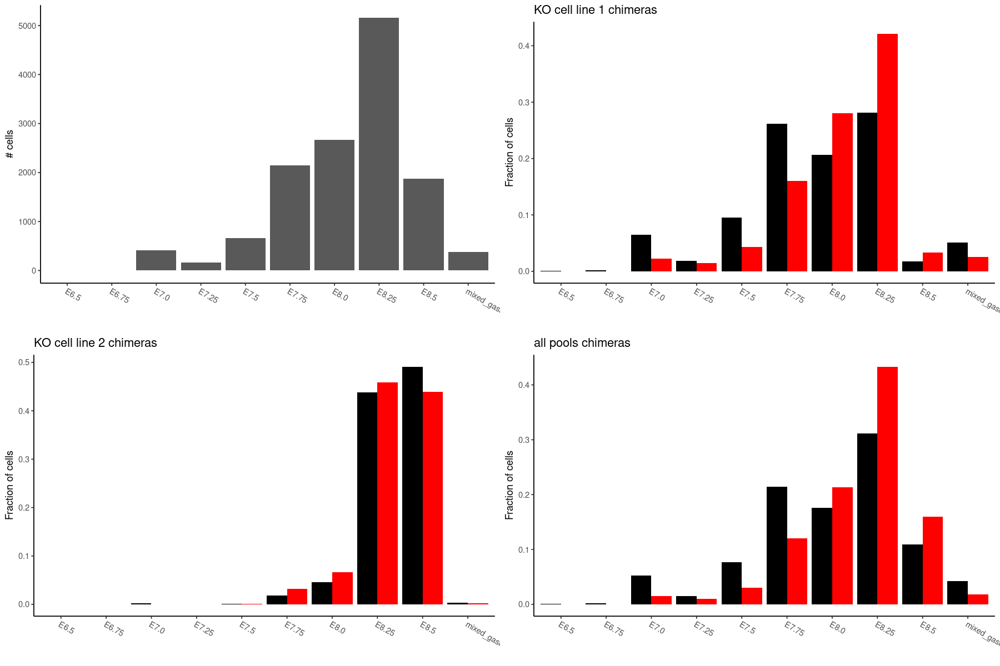

In [90]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4')
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$stage.mapped)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas stage", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])
  

pdf1 = table(meta$stage.mapped[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])


pdf2 = table(meta$stage.mapped[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))], 
                   drop = FALSE)

pdf3 = table(meta$stage.mapped, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas stage", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
    theme_classic() + 
    theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$stage.mapped)[order(unique(meta$stage.mapped))])

options(repr.plot.width = 15, repr.plot.height = 10)
#plot(p1)
grid.arrange(p1, p2, p3, p4, nrow =2)

In [92]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"

In [93]:
pdf(paste0(plot_folder, "wt_chimaera_stage_mapping.pdf"), height=8, width=10)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

png 
  2

In [91]:
embryo1 <- c('mixl_1','mixl_2','mixl_3','mixl_4') # not actually embryo but KO cell line pool
embryo2 <- c('mixl_6','mixl_5')

p1 = ggplot(mapping = aes(x = meta$haem_subclust)) +
  geom_bar(stat = "count", position = "dodge") +
  labs(x = "Atlas subclusters", y = "# cells") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        axis.title.x =  element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])
  
  

pdf1 = table(meta$haem_subclust[meta$sample %in% embryo1], meta$tdTom[meta$sample %in% embryo1])
pdf1 = as.data.frame(sweep(pdf1, 2, colSums(pdf1), "/"))

p2 = ggplot(data = pdf1, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 1 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])


pdf2 = table(meta$haem_subclust[meta$sample %in% embryo2], meta$tdTom[meta$sample %in% embryo2])
pdf2 = as.data.frame(sweep(pdf2, 2, colSums(pdf2), "/"))

p3 = ggplot(data = pdf2, mapping = aes(x = factor(Var1, levels = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))]), 
                                       y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "",
                    drop = FALSE) +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("KO cell line 2 chimeras") +
    theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))], 
                   drop = FALSE)

pdf3 = table(meta$haem_subclust, meta$tdTom)
pdf3 = as.data.frame(sweep(pdf3, 2, colSums(pdf3), "/"))

p4 = ggplot(data = pdf3, mapping = aes(x = Var1, y = Freq, fill = Var2)) +
  geom_bar(stat = "identity", position = "dodge") +
  scale_fill_manual(values = c("pos" = "red", "neg" = "black"), 
                    labels = c("pos" = "Tomato+", "neg" = "Tomato-"),
                    name = "") +
  labs(x = "Atlas subclusters", y = "Fraction of cells") +
  ggtitle("all pools chimeras") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = -30, hjust = 0),
        legend.position = "none",
        axis.title.x = element_blank()) +
  scale_x_discrete(breaks = unique(meta$haem_subclust)[order(unique(meta$haem_subclust))])

options(repr.plot.width = 20, repr.plot.height = 10)
grid.arrange(p1, p2, p3, p4, nrow =2)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'meta' not found


In [96]:

pdf(paste0(plot_folder, "wt_chimaera_celltype_mapping_meso2.pdf"), height=8, width=20)
    grid.arrange(p1, p2, p3, p4, nrow =2)
dev.off()

png 
  2

In [8]:
#big_meta = read.table(paste0(out_folder,"big_meta_mapping+meso2.tab"), header = TRUE, sep = "\t", stringsAsFactors = FALSE, comment.char = "$")
#umap = read.csv('/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/umap_after_correction.csv', header=T, row.names=1,sep=",") %>% select(1:3)
#big_meta = merge(big_meta, umap, by='cell')
source("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plot_colours.R")


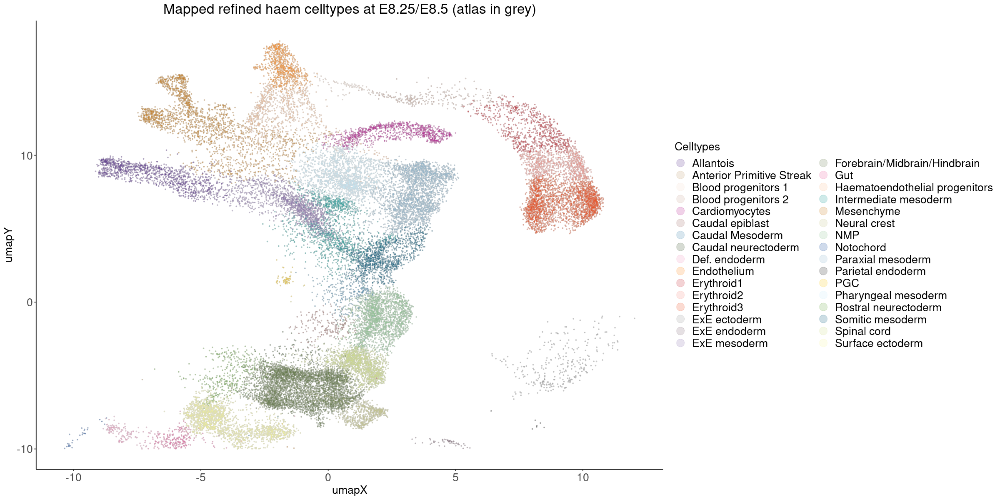

In [114]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= haem_subclust)) +
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype),alpha=0.2, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (atlas in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) +
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(p1)

In [116]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)

#p1 <- ggplot(big_meta_85, aes(umap1, umap2, color= meso.mapped)) +
    #geom_point(alpha=0.5, size = 0.4, color='grey') +
    #geom_point(data=big_meta_85,aes(color=meso_subcluster),alpha=0.2, size = 0.4) +
    #theme_classic() +
    #scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    #ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +
    #theme(legend.position = "none") +
    #theme(plot.title = element_text(hjust = 0.5)) +
    #theme(plot.title = element_text(size=20)) +
    #theme(legend.text=element_text(size=16)) + 
    #theme(legend.title=element_text(size=16)) +
    #theme(axis.text = element_text(size = 16)) +
    #theme(axis.title = element_text(size = 16))

#meso.mapped as a function of meso_subcluster
p2 <- ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=haem_subclust),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = meso_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

plot_grid(
  #p1, 
  p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

ERROR: Error: Problem with `filter()` input `..1`.
[31m✖[39m Input `..1` must be of size 36375 or 1, not size 0.
[34mℹ[39m Input `..1` is `big_meta_85$umap2 >= -10`.


In [ ]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "umap_celltype_mapping+meso.png"), height=750, width=1250)
    grid.arrange(p1, p2)
dev.off()

In [ ]:
p2 <- ggplot(big_meta_85, aes(umap1, umap2, color=celltype)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=meso.mapped),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = meso_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') +     
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))



plot_grid(
  p2,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [ ]:
unique(big_meta$celltype.mapped)

In [ ]:
unique(big_meta$meso_subcluster)

# want to see what initially mapped celltypes were converted to new celltypes

In [37]:
big_meta$celltype_origin = as.character(big_meta$celltype[match(big_meta$cell, chim_meta_85f$closest.cell)]) #atlas cells

In [38]:
length(unique(big_meta$celltype))

[1] 37

In [39]:
length(unique(big_meta$celltype_origin))

[1] 6

In [40]:
df <- unclass(table(big_meta$celltype_origin))
df

Epiblast      ExE ectoderm      ExE endoderm  Primitive Streak 
               72                26                15                17 
Visceral endoderm 
                4

In [41]:
df <- as.data.frame(df) 

In [42]:
summary(df)

       df      
 Min.   : 4.0  
 1st Qu.:15.0  
 Median :17.0  
 Mean   :26.8  
 3rd Qu.:26.0  
 Max.   :72.0  

In [43]:
rownames(df)
df

[1] "Epiblast"          "ExE ectoderm"      "ExE endoderm"     
[4] "Primitive Streak"  "Visceral endoderm"

,df
,<int>
Epiblast,72
ExE ectoderm,26
ExE endoderm,15
Primitive Streak,17
Visceral endoderm,4


In [44]:
df$count <- df$df
#df$celltype <- rownames(df)
sum(df$count)
percent <- list()
df['percent'] <- NA
df

[1] 134

,df,count,percent
,<int>,<int>,<lgl>
Epiblast,72,72,NA
ExE ectoderm,26,26,NA
ExE endoderm,15,15,NA
Primitive Streak,17,17,NA
Visceral endoderm,4,4,NA


In [45]:
df <- df %>% tibble::rownames_to_column() %>% mutate(df, percent = count / sum(count) * 100)

df

rowname,df,count,percent
<chr>,<int>,<int>,<dbl>
Epiblast,72,72,53.731343
ExE ectoderm,26,26,19.402985
ExE endoderm,15,15,11.194030
Primitive Streak,17,17,12.686567
Visceral endoderm,4,4,2.985075


In [46]:
df2 <- df[order(-df$count),]
df2
df3 <- df2[1:21,]
df3
sum(df3$percent) #95.2996474735605
sum(df3$percent[1:10]) #64.9236192714454
sum(df3$percent[1:6]) #45.6521739130435

,rowname,df,count,percent
,<chr>,<int>,<int>,<dbl>
1,Epiblast,72,72,53.731343
2,ExE ectoderm,26,26,19.402985
4,Primitive Streak,17,17,12.686567
3,ExE endoderm,15,15,11.194030
5,Visceral endoderm,4,4,2.985075


,rowname,df,count,percent
,<chr>,<int>,<int>,<dbl>
1,Epiblast,72,72,53.731343
2,ExE ectoderm,26,26,19.402985
4,Primitive Streak,17,17,12.686567
3,ExE endoderm,15,15,11.194030
5,Visceral endoderm,4,4,2.985075
NA,NA,NA,NA,NA
NA.1,NA,NA,NA,NA
NA.2,NA,NA,NA,NA
NA.3,NA,NA,NA,NA


[1] NA

[1] NA

[1] NA

In [47]:
out_folder = '/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/'

In [48]:
# save mapped celltypes
write.csv(df2, paste0(out_folder, 'original_celltype_of_remapped_cells-gut-wt.csv')) 

In [50]:
df5 <- unclass(table(big_meta$gut_subclust.mapped))
df5

Foregut 1           Foregut 2           Hindgut 1           Hindgut 2 
                  9                  16                   3                  38 
             Midgut      Midgut/Hindgut Pharyngeal endoderm 
                 15                  50                  84

In [53]:
sum(df5)

[1] 215

In [62]:
### save big meta with mapping
write.csv(big_meta, "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem2.csv", header = TRUE)

In [196]:
big_meta$haem_subclust.mapped

[1] NA      "EC7"   "Ery4"  "Ery1"  "Ery2"  "EC1"   "EC5"   "Ery3"  "EC2"  
[10] "EC6"   "Haem3" "EC4"   "BP2"   "EC8"   "Mk"    "Haem4" "BP3"   "BP1"  
[19] "EC3"   "BP4"   "Haem2" "My"

# more visualizations

In [88]:
big_meta = read.csv("/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/wildtype_injection/chimera-wt/data/big_meta_mapping+haem2.csv", header = TRUE)

In [90]:
unique(big_meta$celltype_origin)

[1] NA                               "Rostral neurectoderm"          
 [3] "ExE endoderm"                   "Epiblast"                      
 [5] "ExE mesoderm"                   "Blood progenitors 2"           
 [7] "ExE ectoderm"                   "Gut"                           
 [9] "Blood progenitors 1"            "Primitive Streak"              
[11] "Mixed mesoderm"                 "Caudal epiblast"               
[13] "Nascent mesoderm"               "Somitic mesoderm"              
[15] "Mesenchyme"                     "Intermediate mesoderm"         
[17] "Pharyngeal mesoderm"            "Visceral endoderm"             
[19] "Surface ectoderm"               "Notochord"                     
[21] "Parietal endoderm"              "Caudal neurectoderm"           
[23] "Haematoendothelial progenitors" "Def. endoderm"                 
[25] "Caudal Mesoderm"                "Paraxial mesoderm"             
[27] "PGC"                            "Erythroid1"

Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 35833 rows containing missing values (geom_point).”


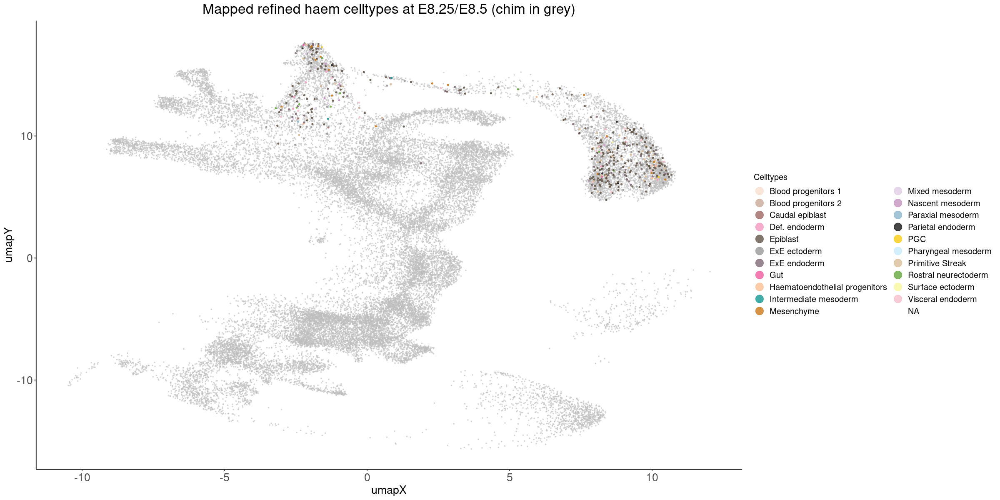

In [68]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

#plot of originally mapped cells now meso.mapped
p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= haem_subclust)) + 
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=celltype_origin),alpha=0.8, size = 0.8) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))


options(repr.plot.width = 20, repr.plot.height = 10)
plot_grid(
  p1,
  align = "h", axis = "b", nrow = 1, rel_widths = c(1, 1.7)
)

In [158]:
plot_folder = "/rds/project/bg200/rds-bg200-hphi-gottgens/users/aamw4/bt392/mouse/Mixl1_KO/plots/"
png(paste0(plot_folder, "wt-umap_celltype_mapping_haem_original_celltypes.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 35833 rows containing missing values (geom_point).”


png 
  2

Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 36375 rows containing missing values (geom_point).”


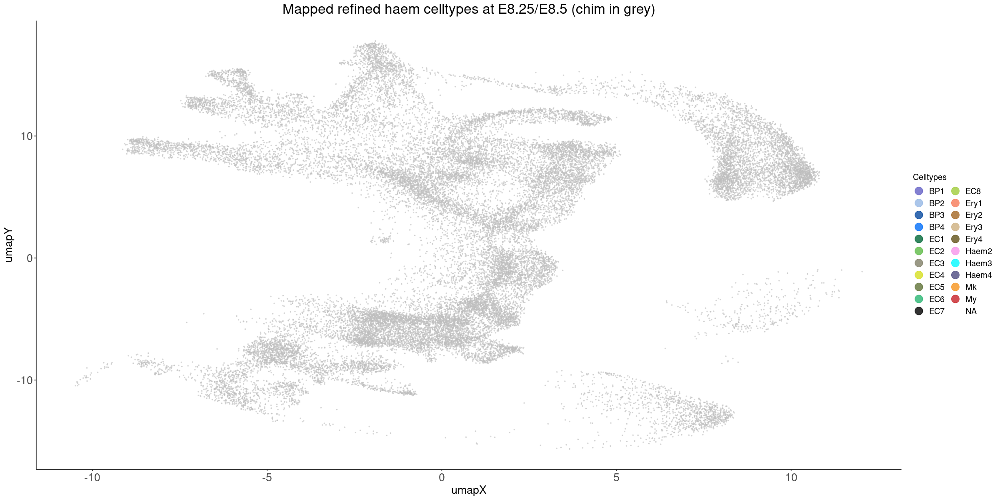

In [67]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

#plot of originally mapped cells now meso.mapped
p1 <- ggplot(big_meta_85, aes(umapX, umapY, color= celltype.mapped)) + 
    geom_point(alpha=0.5, size = 0.4, color='grey') +
    geom_point(data=big_meta_85,aes(color=haem_subclust.mapped),alpha=0.8, size = 0.8) +
    theme_classic() +
    scale_colour_manual(values = haem_colours, labels = haem_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') +
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=12)) + 
    theme(legend.title=element_text(size=12)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 20, repr.plot.height = 10)
plot_grid(p1)

In [73]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umapY >= -10)

haem <- c( "Haematoendothelial progenitors",
                     "Endothelium",
                     "Blood progenitors 1",
                     "Blood progenitors 2",
                     "Erythroid1",
                     "Erythroid2",
                     "Erythroid3")
meso_plot <- big_meta_85 %>% filter(celltype %in% haem | celltype.mapped %in% haem )


p2 <- ggplot(meso_plot, aes(umapX, umapY)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=tdTom),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = c('pos' = 'red', 'neg' = 'black'), labels = c('pos' = 'pos', 'neg' = 'neg')) + 
    ggtitle('tdTom type at E8.25/E8.5 (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(plot.title = element_text(size=20)) +
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p2)

ERROR: Error: Insufficient values in manual scale. 3 needed but only 2 provided.


In [94]:
png(paste0(plot_folder, "umap_meso_mapping_dtTOM.png"), height=750, width=900)
    grid.arrange(p2)
dev.off()

Warning message:
“Removed 11389 rows containing missing values (geom_point).”


png 
  2

In [183]:
df2$rowname

[1] "Epiblast"                       "ExE ectoderm"                  
 [3] "ExE endoderm"                   "Primitive Streak"              
 [5] "Rostral neurectoderm"           "Visceral endoderm"             
 [7] "Mesenchyme"                     "Mixed mesoderm"                
 [9] "Nascent mesoderm"               "Blood progenitors 2"           
[11] "Caudal epiblast"                "Haematoendothelial progenitors"
[13] "Intermediate mesoderm"          "ExE mesoderm"                  
[15] "Parietal endoderm"              "Blood progenitors 1"           
[17] "Def. endoderm"                  "Gut"                           
[19] "Notochord"                      "Paraxial mesoderm"             
[21] "PGC"                            "Pharyngeal mesoderm"           
[23] "Surface ectoderm"               "Caudal Mesoderm"               
[25] "Somitic mesoderm"               "Caudal neurectoderm"           
[27] "Erythroid1"

In [80]:
big_meta_85

X,barcode,batch,cell,celltype,celltype.mapped,closest.cell,cluster,cluster.stage,cluster.sub,⋯,stage,stage.mapped,stripped,tdTom,theiler,umapX,umapY,origin,haem_subclust.mapped,celltype_origin
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
atlas_cell_36865-0,AAACATACCACTGA,0,atlas_cell_36865,Neural crest,nan,nan,10,3,8,⋯,E8.5,nan,0,nan,TS12,1.22614512,-7.987035,atlas,NA,NA
atlas_cell_36866-0,AAACATTGCAACTG,0,atlas_cell_36866,Allantois,nan,nan,13,11,7,⋯,E8.5,nan,0,nan,TS12,-6.29479844,9.852460,atlas,NA,NA
atlas_cell_36867-0,AAACATTGGACGAG,0,atlas_cell_36867,Erythroid3,nan,nan,18,19,4,⋯,E8.5,nan,0,nan,TS12,10.35659608,6.400839,atlas,NA,NA
atlas_cell_36869-0,AAACCGTGGCTAAC,0,atlas_cell_36869,Forebrain/Midbrain/Hindbrain,nan,nan,10,12,7,⋯,E8.5,nan,0,nan,TS12,0.91095525,-5.479232,atlas,NA,NA
atlas_cell_36870-0,AAACCGTGTATCTC,0,atlas_cell_36870,Somitic mesoderm,nan,nan,13,9,5,⋯,E8.5,nan,0,nan,TS12,1.54897766,1.385426,atlas,NA,NA
atlas_cell_36871-0,AAACGCACCCAACA,0,atlas_cell_36871,Gut,nan,nan,9,16,8,⋯,E8.5,nan,0,nan,TS12,-5.91165904,-10.271350,atlas,NA,NA
atlas_cell_36872-0,AAACGCACCCTAAG,0,atlas_cell_36872,Spinal cord,nan,nan,16,7,6,⋯,E8.5,nan,0,nan,TS12,1.45559824,-3.568374,atlas,NA,NA
atlas_cell_36873-0,AAACGCTGAGCGGA,0,atlas_cell_36873,Somitic mesoderm,nan,nan,13,18,5,⋯,E8.5,nan,0,nan,TS12,1.62970885,3.168313,atlas,NA,NA
atlas_cell_36874-0,AAACGCTGCCAAGT,0,atlas_cell_36874,Gut,nan,nan,9,16,8,⋯,E8.5,nan,0,nan,TS12,-6.41788996,-10.531616,atlas,NA,NA


Warning message:
“Removed 3531 rows containing missing values (geom_point).”
Warning message:
“Removed 3531 rows containing missing values (geom_point).”


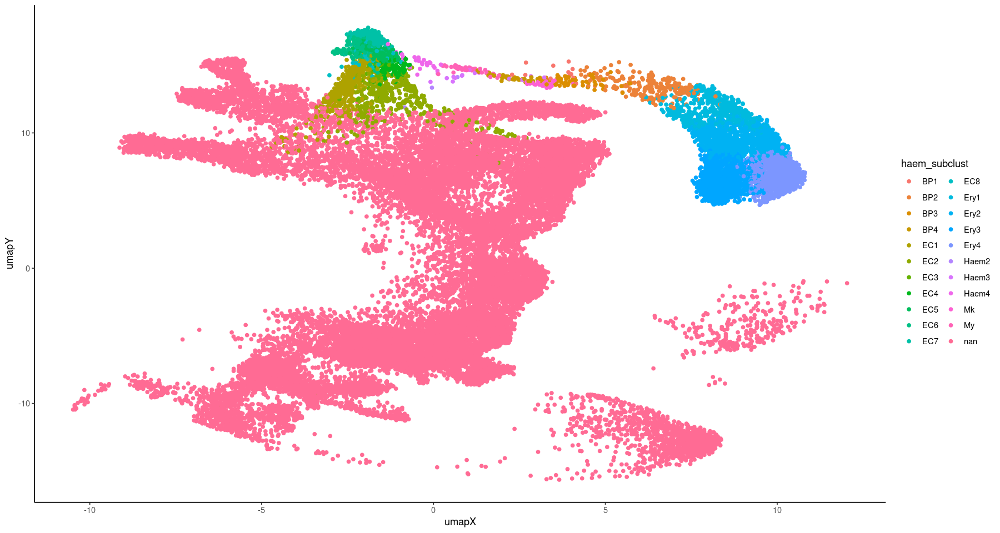

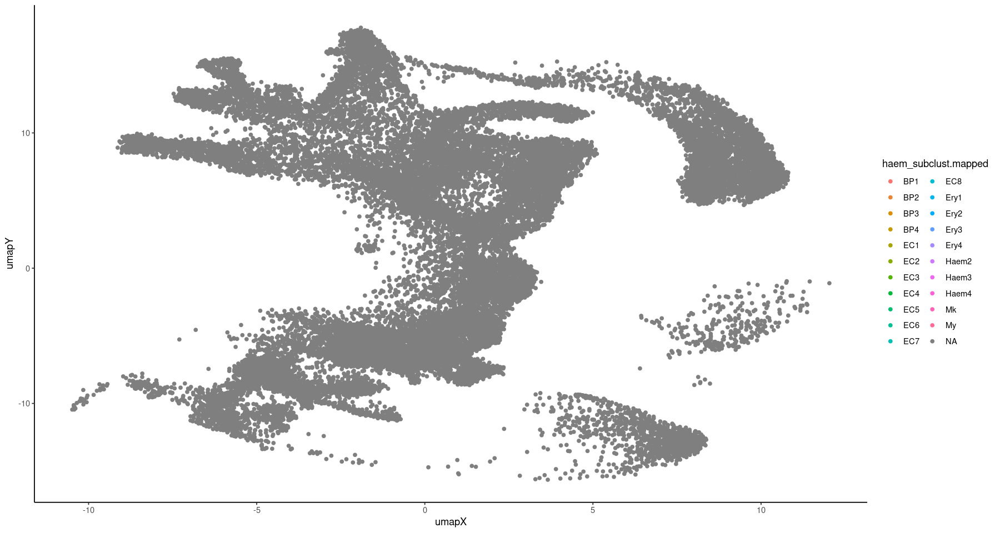

In [79]:
ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust)) + geom_point() + theme_classic()
ggplot(big_meta_85, aes(umapX, umapY, color=haem_subclust.mapped)) + geom_point() + theme_classic()

Warning message:
“Removed 819 rows containing missing values (geom_point).”
Warning message:
“Removed 7215 rows containing missing values (geom_point).”


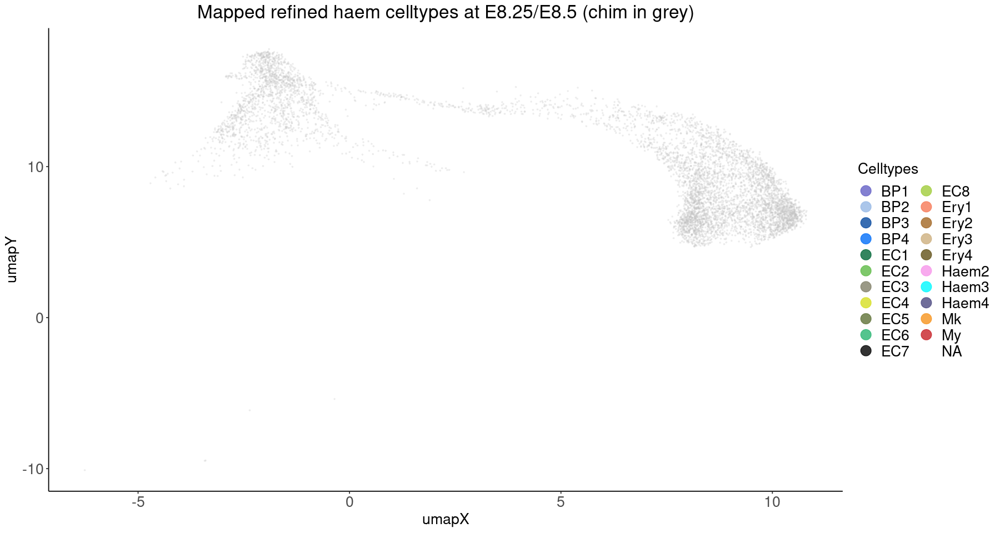

In [78]:
big_meta_85 <- big_meta %>% filter(big_meta$stage %in% c('E8.25','E8.5'))
#big_meta_85 <- big_meta_85 %>% filter(big_meta_85$umap2 >= -10)

haem_total <- cbind(haem, refined_haem)

meso_plot <- big_meta_85 %>% filter(celltype %in% haem_total | celltype.mapped %in% haem_total | haem_subclust %in% haem_total | haem_subclust.mapped %in% haem_total )
p1 <- ggplot(meso_plot, aes(umapX, umapY)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=haem_subclust.mapped),alpha=0.8, size = 0.8) +
    theme_classic() +
    scale_colour_manual(values = haem_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped refined haem celltypes at E8.25/E8.5 (chim in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [96]:
png(paste0(plot_folder, "umap_meso_mapping_chim_meso-region.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 26098 rows containing missing values (geom_point).”


png 
  2

Warning message:
“Removed 11050 rows containing missing values (geom_point).”


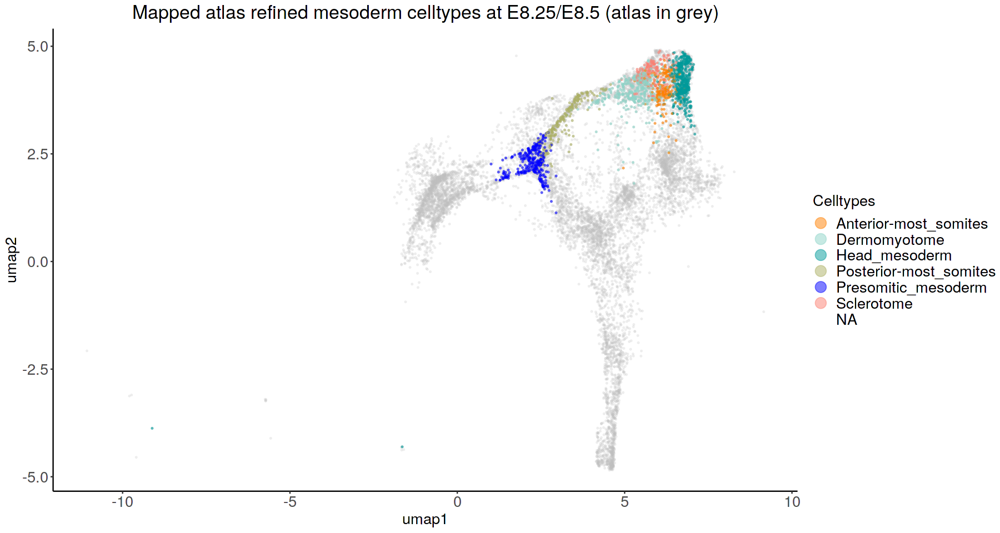

In [97]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP")


meso_plot <- big_meta_85 %>% filter(celltype %in% meso | meso.mapped %in% meso | meso_subcluster %in% meso )


p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=meso_subcluster),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('Mapped atlas refined mesoderm celltypes at E8.25/E8.5 (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [98]:
png(paste0(plot_folder, "umap_meso_mapping_atlas.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

Warning message:
“Removed 11050 rows containing missing values (geom_point).”


png 
  2

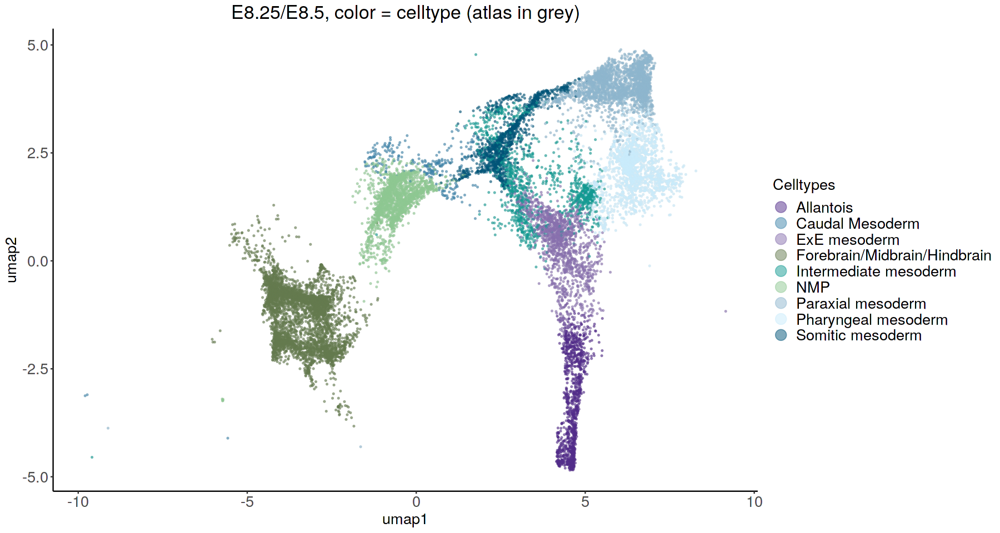

In [99]:
meso <- c("Nascent mesoderm",
                     "Mixed mesoderm",
                     "Intermediate mesoderm",
                     "Caudal Mesoderm",
                     "Paraxial mesoderm",
                     "Somitic mesoderm",
                     "Pharyngeal mesoderm",
                     "Head_mesoderm",
                     "Anterior-most_somites",
                     "Presomitic_mesoderm",
                     "Sclerotome",
                     "Dermomyotome",
                     "Posterior-most_somites",
                     "Allantois",
                     "ExE mesoderm", "NMP",
                     "Forebrain/Midbrain/Hindbrain")


meso_plot <- big_meta_85 %>% filter(celltype %in% meso | celltype_origin %in% meso )


p1 <- ggplot(meso_plot, aes(umap1, umap2)) +
    geom_point(alpha=0.2, size = 0.4, color='grey') +
    geom_point(data=meso_plot,aes(color=celltype),alpha=0.5, size = 0.4) +
    theme_classic() +
    scale_colour_manual(values = celltype_colours, labels = celltype_labels, name = "Celltypes") +
    ggtitle('E8.25/E8.5, color = celltype (atlas in grey)') + 
    guides(colour = guide_legend(override.aes = list(size=5))) +
    theme(plot.title = element_text(hjust = 0.5)) + 
    theme(legend.text=element_text(size=16)) + 
    theme(legend.title=element_text(size=16)) +
    theme(plot.title = element_text(size=20)) +
    theme(axis.text = element_text(size = 16)) +
    theme(axis.title = element_text(size = 16))

options(repr.plot.width = 15, repr.plot.height = 8)
grid.arrange(p1)

In [100]:
png(paste0(plot_folder, "umap_mapping_atlas.png"), height=750, width=1250)
    grid.arrange(p1)
dev.off()

png 
  2

In [166]:
colnames(big_meta)

[1] "cell"                "sample"              "stage"              
 [4] "barcode"             "sequencing.batch"    "stripped"           
 [7] "doublet"             "theiler"             "doub.density"       
[10] "cluster"             "cluster.sub"         "cluster.stage"      
[13] "cluster.theiler"     "celltype"            "colour"             
[16] "umapX"               "umapY"               "haem_gephiX"        
[19] "haem_gephiY"         "haem_subclust"       "endo_gephiX"        
[22] "endo_gephiY"         "endo_trajectoryName" "endo_trajectoryDPT" 
[25] "endo_gutX"           "endo_gutY"           "endo_gutDPT"        
[28] "endo_gutCluster"     "weight"              "stage.mapped"       
[31] "celltype.mapped"     "closest.cell"        "tdTom"              
[34] "meso.mapped"         "meso_subcluster"     "umap1"              
[37] "umap2"               "celltype_origin"     "origin"

In [165]:
df <- unclass(table(big_meta$celltype.mapped))
df

Allantois      Anterior Primitive Streak 
                          2881                              1 
           Blood progenitors 1            Blood progenitors 2 
                           127                            460 
                Cardiomyocytes                Caudal epiblast 
                          1225                              7 
               Caudal Mesoderm            Caudal neurectoderm 
                           153                              1 
                 Def. endoderm                    Endothelium 
                           444                             22 
                    Erythroid1                     Erythroid2 
                          1141                           2495 
                    Erythroid3                   ExE ectoderm 
                          1518                            167 
                  ExE endoderm                   ExE mesoderm 
                           111                           2977 
  Forebrain/Midbrain/Hindbrain                            Gut 
                          5337                           1102 
Haematoendothelial progenitors          Intermediate mesoderm 
                            19                           1625 
                    Mesenchyme                 Mixed mesoderm 
                           640                              1 
                  Neural crest                            NMP 
                          1407                           2049 
                     Notochord              Paraxial mesoderm 
                            75                           2606 
             Parietal endoderm                            PGC 
                             1                             91 
           Pharyngeal mesoderm           Rostral neurectoderm 
                          2155                             27 
              Somitic mesoderm                    Spinal cord 
                          1621                           1962 
              Surface ectoderm              Visceral endoderm 
                          2713                             47